# Scene Graph Visualization
Visualize all graphs in `data/gen/spine_exp1/formatted.json` using NetworkX.

In [12]:
import json
import re
from ast import literal_eval

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import networkx as nx
import numpy as np

In [13]:
with open("data/gen/spine_exp1/formatted.json") as f:
    dataset = json.load(f)

print(f"Total conversations: {len(dataset)}")

Total conversations: 990


In [14]:
def extract_scene_graph(conversation: dict) -> dict:
    """Extract the scene graph dict from the first user message."""
    first_user_msg = conversation["conversations"][0]["content"]
    match = re.search(r"[Ss]cene graph:?\s*(\{.*\})", first_user_msg)
    if match is None:
        return None
    return literal_eval(match.group(1))


def build_nx_graph(sg: dict) -> nx.Graph:
    """Build a NetworkX graph from a scene graph dict."""
    G = nx.Graph()

    for node in sg.get("objects", []):
        G.add_node(node["name"], coords=node["coords"], type="object")

    for node in sg.get("regions", []):
        G.add_node(node["name"], coords=node["coords"], type="region")

    for edge in sg.get("object_connections", []):
        if edge[0] in G.nodes and edge[1] in G.nodes:
            G.add_edge(edge[0], edge[1], type="object")

    for edge in sg.get("region_connections", []):
        if edge[0] in G.nodes and edge[1] in G.nodes:
            G.add_edge(edge[0], edge[1], type="region")

    return G


# Parse all graphs
graphs = []
robot_locations = []
for entry in dataset:
    sg = extract_scene_graph(entry)
    if sg is not None:
        graphs.append(build_nx_graph(sg))
        robot_locations.append(sg.get("robot_location"))

print(f"Parsed {len(graphs)} graphs out of {len(dataset)} conversations")

Parsed 990 graphs out of 990 conversations


In [15]:
# Quick stats
node_counts = [G.number_of_nodes() for G in graphs]
edge_counts = [G.number_of_edges() for G in graphs]
print(f"Nodes \u2014 min: {min(node_counts)}, max: {max(node_counts)}, mean: {np.mean(node_counts):.1f}")
print(f"Edges \u2014 min: {min(edge_counts)}, max: {max(edge_counts)}, mean: {np.mean(edge_counts):.1f}")

Nodes — min: 1, max: 37, mean: 22.8
Edges — min: 0, max: 37, mean: 20.8


## Distribution Statistics

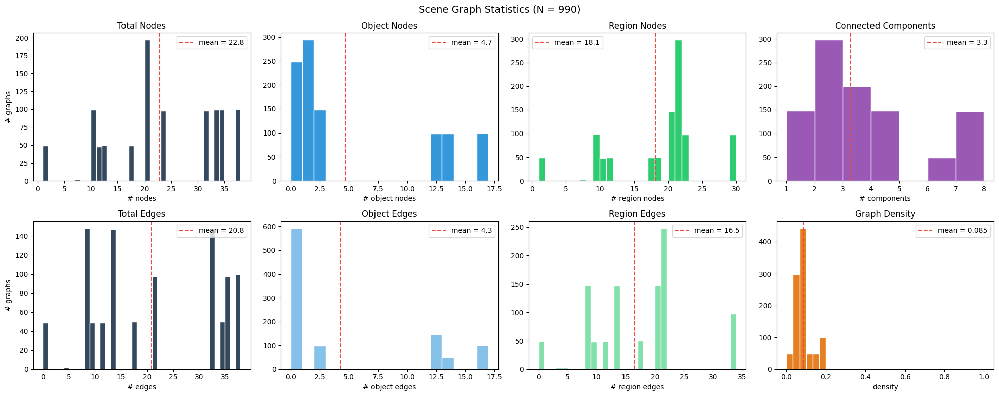

In [16]:
node_counts = np.array([G.number_of_nodes() for G in graphs])
edge_counts = np.array([G.number_of_edges() for G in graphs])
object_counts = np.array([sum(1 for _, d in G.nodes(data=True) if d.get("type") == "object") for G in graphs])
region_counts = np.array([sum(1 for _, d in G.nodes(data=True) if d.get("type") == "region") for G in graphs])
obj_edge_counts = np.array([sum(1 for _, _, d in G.edges(data=True) if d.get("type") == "object") for G in graphs])
reg_edge_counts = np.array([sum(1 for _, _, d in G.edges(data=True) if d.get("type") == "region") for G in graphs])
density = np.array([nx.density(G) for G in graphs])
components = np.array([nx.number_connected_components(G) for G in graphs])

fig, axes = plt.subplots(2, 4, figsize=(20, 8))

# --- Row 1: Node distributions ---
axes[0, 0].hist(node_counts, bins=range(node_counts.min(), node_counts.max() + 2), edgecolor="white", color="#34495e")
axes[0, 0].set_title("Total Nodes")
axes[0, 0].set_xlabel("# nodes")
axes[0, 0].set_ylabel("# graphs")
axes[0, 0].axvline(node_counts.mean(), color="#e74c3c", ls="--", label=f"mean = {node_counts.mean():.1f}")
axes[0, 0].legend()

axes[0, 1].hist(object_counts, bins=range(object_counts.min(), object_counts.max() + 2), edgecolor="white", color="#3498db")
axes[0, 1].set_title("Object Nodes")
axes[0, 1].set_xlabel("# object nodes")
axes[0, 1].axvline(object_counts.mean(), color="#e74c3c", ls="--", label=f"mean = {object_counts.mean():.1f}")
axes[0, 1].legend()

axes[0, 2].hist(region_counts, bins=range(region_counts.min(), region_counts.max() + 2), edgecolor="white", color="#2ecc71")
axes[0, 2].set_title("Region Nodes")
axes[0, 2].set_xlabel("# region nodes")
axes[0, 2].axvline(region_counts.mean(), color="#e74c3c", ls="--", label=f"mean = {region_counts.mean():.1f}")
axes[0, 2].legend()

axes[0, 3].hist(components, bins=range(components.min(), components.max() + 2), edgecolor="white", color="#9b59b6")
axes[0, 3].set_title("Connected Components")
axes[0, 3].set_xlabel("# components")
axes[0, 3].axvline(components.mean(), color="#e74c3c", ls="--", label=f"mean = {components.mean():.1f}")
axes[0, 3].legend()

# --- Row 2: Edge distributions ---
axes[1, 0].hist(edge_counts, bins=range(edge_counts.min(), edge_counts.max() + 2), edgecolor="white", color="#34495e")
axes[1, 0].set_title("Total Edges")
axes[1, 0].set_xlabel("# edges")
axes[1, 0].set_ylabel("# graphs")
axes[1, 0].axvline(edge_counts.mean(), color="#e74c3c", ls="--", label=f"mean = {edge_counts.mean():.1f}")
axes[1, 0].legend()

axes[1, 1].hist(obj_edge_counts, bins=range(obj_edge_counts.min(), obj_edge_counts.max() + 2), edgecolor="white", color="#85c1e9")
axes[1, 1].set_title("Object Edges")
axes[1, 1].set_xlabel("# object edges")
axes[1, 1].axvline(obj_edge_counts.mean(), color="#e74c3c", ls="--", label=f"mean = {obj_edge_counts.mean():.1f}")
axes[1, 1].legend()

axes[1, 2].hist(reg_edge_counts, bins=range(reg_edge_counts.min(), reg_edge_counts.max() + 2), edgecolor="white", color="#82e0aa")
axes[1, 2].set_title("Region Edges")
axes[1, 2].set_xlabel("# region edges")
axes[1, 2].axvline(reg_edge_counts.mean(), color="#e74c3c", ls="--", label=f"mean = {reg_edge_counts.mean():.1f}")
axes[1, 2].legend()

axes[1, 3].hist(density, bins=30, edgecolor="white", color="#e67e22")
axes[1, 3].set_title("Graph Density")
axes[1, 3].set_xlabel("density")
axes[1, 3].axvline(density.mean(), color="#e74c3c", ls="--", label=f"mean = {density.mean():.3f}")
axes[1, 3].legend()

fig.suptitle(f"Scene Graph Statistics (N = {len(graphs)})", fontsize=14)
fig.tight_layout()
plt.show()

In [17]:
# Summary table
stats = {
    "Metric": ["Total Nodes", "Object Nodes", "Region Nodes", "Total Edges", "Object Edges", "Region Edges", "Density", "Connected Components"],
    "Min":    [node_counts.min(), object_counts.min(), region_counts.min(), edge_counts.min(), obj_edge_counts.min(), reg_edge_counts.min(), f"{density.min():.3f}", components.min()],
    "Max":    [node_counts.max(), object_counts.max(), region_counts.max(), edge_counts.max(), obj_edge_counts.max(), reg_edge_counts.max(), f"{density.max():.3f}", components.max()],
    "Mean":   [f"{node_counts.mean():.1f}", f"{object_counts.mean():.1f}", f"{region_counts.mean():.1f}", f"{edge_counts.mean():.1f}", f"{obj_edge_counts.mean():.1f}", f"{reg_edge_counts.mean():.1f}", f"{density.mean():.3f}", f"{components.mean():.1f}"],
    "Std":    [f"{node_counts.std():.1f}", f"{object_counts.std():.1f}", f"{region_counts.std():.1f}", f"{edge_counts.std():.1f}", f"{obj_edge_counts.std():.1f}", f"{reg_edge_counts.std():.1f}", f"{density.std():.3f}", f"{components.std():.1f}"],
    "Median": [np.median(node_counts), np.median(object_counts), np.median(region_counts), np.median(edge_counts), np.median(obj_edge_counts), np.median(reg_edge_counts), f"{np.median(density):.3f}", np.median(components)],
}

# Print as aligned table
header = f"{'Metric':<22} {'Min':>6} {'Max':>6} {'Mean':>8} {'Std':>8} {'Median':>8}"
print(header)
print("-" * len(header))
for i in range(len(stats["Metric"])):
    print(f"{stats['Metric'][i]:<22} {str(stats['Min'][i]):>6} {str(stats['Max'][i]):>6} {str(stats['Mean'][i]):>8} {str(stats['Std'][i]):>8} {str(stats['Median'][i]):>8}")

Metric                    Min    Max     Mean      Std   Median
---------------------------------------------------------------
Total Nodes                 1     37     22.8     10.3     20.0
Object Nodes                0     16      4.7      6.0      1.0
Region Nodes                1     29     18.1      6.8     20.0
Total Edges                 0     37     20.8     11.9     17.0
Object Edges                0     16      4.3      6.2      0.0
Region Edges                0     33     16.5      8.1     17.0
Density                 0.000  1.000    0.085    0.052    0.075
Connected Components        1      7      3.3      1.9      3.0


## Graph Visualizations

In [ ]:
def draw_scene_graph(G: nx.Graph, robot_location: str, ax: plt.Axes, title: str = ""):
    """Draw a single scene graph on the given axes."""
    if G.number_of_nodes() == 0:
        ax.set_title(title)
        ax.text(0.5, 0.5, "Empty graph", ha="center", va="center", transform=ax.transAxes)
        ax.axis("off")
        return

    # Use actual coordinates as layout positions
    pos = {}
    for node, data in G.nodes(data=True):
        c = data.get("coords", [0, 0])
        pos[node] = (c[0], c[1])

    # Node colors by type
    node_colors = []
    for node, data in G.nodes(data=True):
        if node == robot_location:
            node_colors.append("#e74c3c")  # red for robot
        elif data.get("type") == "object":
            node_colors.append("#3498db")  # blue for objects
        else:
            node_colors.append("#2ecc71")  # green for regions

    # Edge colors by type
    edge_colors = []
    for u, v, data in G.edges(data=True):
        if data.get("type") == "object":
            edge_colors.append("#85c1e9")  # light blue
        else:
            edge_colors.append("#82e0aa")  # light green

    nx.draw_networkx(
        G, pos, ax=ax,
        node_color=node_colors,
        edge_color=edge_colors,
        node_size=120,
        font_size=4,
        width=1.5,
        with_labels=True,
    )

    ax.set_title(title, fontsize=7)
    ax.axis("off")

In [18]:
# Visualize all graphs in a grid
COLS = 6
n = len(graphs)
ROWS = int(np.ceil(n / COLS))

fig, axes = plt.subplots(ROWS, COLS, figsize=(COLS * 4, ROWS * 3.5))
axes = axes.flatten()

for i, (G, robot_loc) in enumerate(zip(graphs, robot_locations)):
    draw_scene_graph(G, robot_loc, axes[i], title=f"Graph {i}")

# Hide unused axes
for j in range(n, len(axes)):
    axes[j].axis("off")

# Legend
legend_handles = [
    mpatches.Patch(color="#e74c3c", label="Robot location"),
    mpatches.Patch(color="#3498db", label="Object"),
    mpatches.Patch(color="#2ecc71", label="Region"),
]
fig.legend(handles=legend_handles, loc="upper right", fontsize=10)
fig.suptitle(f"All {n} Scene Graphs from spine_exp1/formatted.json", fontsize=14, y=1.0)
fig.tight_layout()
plt.show()